# Project Title : Used Car Price Prediction and Segmentation



## Objectives:
* Develop a model to predict used car prices based on key attributes like make, model, year, miles, etc.
* Identify key factors that influence used car prices using statistical analysis.
* Analyze used car price trends over time.
* Compare used car price variation across different makes, models, body styles.

### Import required libraries and csv file

In [1]:
# Import the required libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
import warnings as wr
wr.filterwarnings('ignore')

In [2]:
# Data loading
data = pd.read_csv("C:/Users/lohithlikith/Documents/Datasets/Car Price Prediction/data.csv")

In [3]:
### Understanding the data

### Information about dataset
-------------------------------------------------------------------------------------------    
Make: This represents the brand or manufacturer of the vehicles in the dataset. For example, Chevrolet, Ford, Volkswagen, etc.

Model: This indicates the specific model of the vehicles, such as Silverado 1500, Tundra, F-150, etc.

Year: This indicates the manufacturing year of the vehicles, representing the model year they belong to.

Engine Fuel Type: This describes the type of fuel used by the vehicles' engines, like regular unleaded, premium unleaded, diesel, electric, etc.

Engine_HP: This represents the horsepower (HP) output of the vehicles' engines, which is a measure of their power.

Engine_Cylinders: This indicates the number of cylinders present in the vehicles' engines, which typically correlates with engine size and performance.

Transmission Type: This specifies the type of transmission system used in the vehicles, such as automatic, manual, automated manual, etc.

Driven Wheels: This indicates the configuration of the wheels that receive power from the engine, like front-wheel drive, rear-wheel drive, all-wheel drive, four-wheel drive.

Number_of_Doors: This specifies the number of doors on each vehicle, indicating whether it's a two-door or four-door model.

Market Category: This categorizes the vehicles based on market segments or characteristics, such as crossover, luxury, performance, hatchback, etc.

Vehicle Size: This describes the size category of the vehicles, such as compact, midsize, large.

Vehicle Style: This represents the body style or configuration of the vehicles, like sedan, SUV (sport utility vehicle), coupe, convertible, hatchback, etc.
    
highway_MPG: This represents the miles per gallon (MPG) rating of the vehicles when driven on highways, indicating their fuel efficiency during highway driving.

city_mpg: This represents the miles per gallon (MPG) rating of the vehicles when driven in city conditions, indicating their fuel efficiency during city driving.

Popularity: This could represent a measure of the popularity or desirability of the vehicles, which may be based on factors such as sales figures, consumer interest, or other metrics.

MSRP: This stands for Manufacturer's Suggested Retail Price (MSRP), which represents the suggested selling price of the vehicles as set by the manufacturer.    

In [4]:
## to get top 5 rows of dataset
data.head()

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
0,BMW,1 Series M,2011,premium unleaded (required),335.0,6.0,MANUAL,rear wheel drive,2.0,"Factory Tuner,Luxury,High-Performance",Compact,Coupe,26,19,3916,46135
1,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Convertible,28,19,3916,40650
2,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,High-Performance",Compact,Coupe,28,20,3916,36350
3,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Coupe,28,18,3916,29450
4,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Luxury,Compact,Convertible,28,18,3916,34500


In [5]:
## to get bottom 5 rows of dataset
data.tail()

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
11909,Acura,ZDX,2012,premium unleaded (required),300.0,6.0,AUTOMATIC,all wheel drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr Hatchback,23,16,204,46120
11910,Acura,ZDX,2012,premium unleaded (required),300.0,6.0,AUTOMATIC,all wheel drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr Hatchback,23,16,204,56670
11911,Acura,ZDX,2012,premium unleaded (required),300.0,6.0,AUTOMATIC,all wheel drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr Hatchback,23,16,204,50620
11912,Acura,ZDX,2013,premium unleaded (recommended),300.0,6.0,AUTOMATIC,all wheel drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr Hatchback,23,16,204,50920
11913,Lincoln,Zephyr,2006,regular unleaded,221.0,6.0,AUTOMATIC,front wheel drive,4.0,Luxury,Midsize,Sedan,26,17,61,28995


In [6]:
num_rows, num_cols = data.shape
print("Number of rows:", num_rows)
print("Number of columns:", num_cols)

Number of rows: 11914
Number of columns: 16


In [7]:
total_elements = data.size
print("Total number of elements in the DataFrame:", total_elements)

Total number of elements in the DataFrame: 190624


In [8]:
## information about the data(to get non-null values count and data type )
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11914 entries, 0 to 11913
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Make               11914 non-null  object 
 1   Model              11914 non-null  object 
 2   Year               11914 non-null  int64  
 3   Engine Fuel Type   11911 non-null  object 
 4   Engine HP          11845 non-null  float64
 5   Engine Cylinders   11884 non-null  float64
 6   Transmission Type  11914 non-null  object 
 7   Driven_Wheels      11914 non-null  object 
 8   Number of Doors    11908 non-null  float64
 9   Market Category    8172 non-null   object 
 10  Vehicle Size       11914 non-null  object 
 11  Vehicle Style      11914 non-null  object 
 12  highway MPG        11914 non-null  int64  
 13  city mpg           11914 non-null  int64  
 14  Popularity         11914 non-null  int64  
 15  MSRP               11914 non-null  int64  
dtypes: float64(3), int64(5

### Output Explanation:
Above results show variables like Engine Fuel Type, Engine HP, Engine Cylinders, No. of Doors,and Market Category have missing values in the data and shows datatype of each column.

In [9]:
## column datatype
data.dtypes

Make                  object
Model                 object
Year                   int64
Engine Fuel Type      object
Engine HP            float64
Engine Cylinders     float64
Transmission Type     object
Driven_Wheels         object
Number of Doors      float64
Market Category       object
Vehicle Size          object
Vehicle Style         object
highway MPG            int64
city mpg               int64
Popularity             int64
MSRP                   int64
dtype: object

In [10]:
## Describe th data
data.describe()

,Year,Engine HP,Engine Cylinders,Number of Doors,highway MPG,city mpg,Popularity,MSRP
count,11914.000000,11845.00000,11884.000000,11908.000000,11914.000000,11914.000000,11914.000000,1.191400e+04
mean,2010.384338,249.38607,5.628829,3.436093,26.637485,19.733255,1554.911197,4.059474e+04
std,7.579740,109.19187,1.780559,0.881315,8.863001,8.987798,1441.855347,6.010910e+04
min,1990.000000,55.00000,0.000000,2.000000,12.000000,7.000000,2.000000,2.000000e+03
25%,2007.000000,170.00000,4.000000,2.000000,22.000000,16.000000,549.000000,2.100000e+04
50%,2015.000000,227.00000,6.000000,4.000000,26.000000,18.000000,1385.000000,2.999500e+04
75%,2016.000000,300.00000,6.000000,4.000000,30.000000,22.000000,2009.000000,4.223125e+04
max,2017.000000,1001.00000,16.000000,4.000000,354.000000,137.000000,5657.000000,2.065902e+06


### Output Explanation:
Year Distribution:The dataset covers vehicle models from 1990 to 2017, with a majority of vehicles concentrated around the mid-2000s to mid-2010s.
The distribution of vehicle years has a relatively normal distribution, with the mean year around 2010.

Engine Characteristics:
Engine Horsepower (HP): The horsepower of the engines varies widely, with a mean of around 249.39 and a standard deviation of approximately 109.19. There are some extreme values, with the minimum horsepower being 55 and the maximum being 1001.

Engine Cylinders: The number of cylinders in the engines ranges from 0 to 16, with a mean of approximately 5.63. The distribution appears to be slightly positively skewed.

Number of Doors:
Most vehicles in the dataset have either 2 or 4 doors, with a mean of approximately 3.44.
The standard deviation is relatively low (around 0.88), indicating that the majority of vehicles fall within a narrow range of door counts.

Fuel Efficiency:
Highway MPG: The highway miles per gallon (MPG) of the vehicles range from 12 to 354, with a mean of around 26.64 and a standard deviation of approximately 8.86.

City MPG: The city miles per gallon (MPG) of the vehicles range from 7 to 137, with a mean of approximately 19.73 and a standard deviation of around 8.99.
Both highway and city MPG distributions appear to be positively skewed, with a wider spread in the highway MPG values.

Popularity:
The popularity scores of the vehicles vary widely, with a mean of approximately 1554.91 and a standard deviation of around 1441.86.
There seems to be a wide range of popularity scores, with some vehicles being significantly more popular than others.

Manufacturer's Suggested Retail Price (MSRP):
The MSRP of the vehicles ranges from 2000 to 2,065,902, with a mean of approximately 40,594 and a standard deviation of around 60,109.
There are some extremely high MSRP values, which could indicate luxury or high-performance vehicles in the dataset.

In [11]:
# Describe categorical data
data.describe(include='object')

,Make,Model,Engine Fuel Type,Transmission Type,Driven_Wheels,Market Category,Vehicle Size,Vehicle Style
count,11914,11914,11911,11914,11914,8172,11914,11914
unique,48,915,10,5,4,71,3,16
top,Chevrolet,Silverado 1500,regular unleaded,AUTOMATIC,front wheel drive,Crossover,Compact,Sedan
freq,1123,156,7172,8266,4787,1110,4764,3048


### Output Explanation:

Make: There are a total of 11,914 entries, representing 48 different vehicle manufacturers. Chevrolet emerges as the most frequent make, with 1,123 occurrences.

Model: With 11,914 non-null entries, there are 915 unique vehicle models listed. "Silverado 1500" stands out as the most frequent model, appearing 156 times.

Engine Fuel Type: This category contains 11,911 non-null entries, covering 10 different types of engine fuel. "Regular unleaded" is predominant, with 7,172 instances.

Transmission Type: There are 11,914 entries, categorizing transmissions into 5 types. "Automatic" transmissions dominate, with 8,266 occurrences.

Driven Wheels: This category, with 11,914 entries, categorizes vehicles based on the type of wheels driven. "Front wheel drive" is the most common, appearing 4,787 times.

Market Category: While there are 8,172 non-null entries, indicating some missing values, there are 71 unique market categories listed. "Crossover" emerges as the most frequent category, with 1,110 occurrences.

Vehicle Size: With 11,914 entries, vehicles are categorized into 3 sizes. "Compact" vehicles are the most prevalent, appearing 4,764 times.

Vehicle Style: This category, with 11,914 entries, classifies vehicles into 16 unique styles. "Sedan" is the most common style, appearing 3,048 times.

In [12]:
data.columns = data.columns.str.replace(" ", "_")
data.head()

,Make,Model,Year,Engine_Fuel_Type,Engine_HP,Engine_Cylinders,Transmission_Type,Driven_Wheels,Number_of_Doors,Market_Category,Vehicle_Size,Vehicle_Style,highway_MPG,city_mpg,Popularity,MSRP
0,BMW,1 Series M,2011,premium unleaded (required),335.0,6.0,MANUAL,rear wheel drive,2.0,"Factory Tuner,Luxury,High-Performance",Compact,Coupe,26,19,3916,46135
1,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Convertible,28,19,3916,40650
2,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,High-Performance",Compact,Coupe,28,20,3916,36350
3,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Coupe,28,18,3916,29450
4,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Luxury,Compact,Convertible,28,18,3916,34500


In [13]:
# column names
data.columns.tolist()

['Make',
 'Model',
 'Year',
 'Engine_Fuel_Type',
 'Engine_HP',
 'Engine_Cylinders',
 'Transmission_Type',
 'Driven_Wheels',
 'Number_of_Doors',
 'Market_Category',
 'Vehicle_Size',
 'Vehicle_Style',
 'highway_MPG',
 'city_mpg',
 'Popularity',
 'MSRP']

In [14]:
## rename the column name with new column names
data.rename(columns={'Engine_Fuel_Type':'Fuel_Type', 
                         'Engine_HP':'HP','Engine_Cylinders':'Cylinders', 'Transmission_Type':'Transmission',
                         'Number_of_Doors':'Doors','Vehicle_Size':'Size', 'Vehicle_Style':'Style','MSRP':'price'},inplace = True)
data.columns

Index(['Make', 'Model', 'Year', 'Fuel_Type', 'HP', 'Cylinders', 'Transmission',
       'Driven_Wheels', 'Doors', 'Market_Category', 'Size', 'Style',
       'highway_MPG', 'city_mpg', 'Popularity', 'price'],
      dtype='object')

In [15]:
## objects feature(column) names
objects = list(data.dtypes[data.dtypes == 'object'].index)
objects

['Make',
 'Model',
 'Fuel_Type',
 'Transmission',
 'Driven_Wheels',
 'Market_Category',
 'Size',
 'Style']

In [16]:
## values counts of variable in each column
for i in objects:
    print(i + ' :')
    print(data[i].value_counts())
    print('--------------------------------------------------------')

Make :
Chevrolet        1123
Ford              881
Volkswagen        809
Toyota            746
Dodge             626
Nissan            558
GMC               515
Honda             449
Mazda             423
Cadillac          397
Mercedes-Benz     353
Suzuki            351
BMW               334
Infiniti          330
Audi              328
Hyundai           303
Volvo             281
Subaru            256
Acura             252
Kia               231
Mitsubishi        213
Lexus             202
Buick             196
Chrysler          187
Pontiac           186
Lincoln           164
Oldsmobile        150
Land Rover        143
Porsche           136
Saab              111
Aston Martin       93
Plymouth           82
Bentley            74
Ferrari            69
FIAT               62
Scion              60
Maserati           58
Lamborghini        52
Rolls-Royce        31
Lotus              29
Tesla              18
HUMMER             17
Maybach            16
Alfa Romeo          5
McLaren             5
Spy

In [17]:
## numerical feature(column)
numerical = list(data.dtypes[data.dtypes != 'object'].index)
numerical

['Year',
 'HP',
 'Cylinders',
 'Doors',
 'highway_MPG',
 'city_mpg',
 'Popularity',
 'price']

In [18]:
# Cleaning cayegorical data in our dataset
for col in objects:
    data[col] = data[col].str.replace(" ", "_")
    
data.head()

,Make,Model,Year,Fuel_Type,HP,Cylinders,Transmission,Driven_Wheels,Doors,Market_Category,Size,Style,highway_MPG,city_mpg,Popularity,price
0,BMW,1_Series_M,2011,premium_unleaded_(required),335.0,6.0,MANUAL,rear_wheel_drive,2.0,"Factory_Tuner,Luxury,High-Performance",Compact,Coupe,26,19,3916,46135
1,BMW,1_Series,2011,premium_unleaded_(required),300.0,6.0,MANUAL,rear_wheel_drive,2.0,"Luxury,Performance",Compact,Convertible,28,19,3916,40650
2,BMW,1_Series,2011,premium_unleaded_(required),300.0,6.0,MANUAL,rear_wheel_drive,2.0,"Luxury,High-Performance",Compact,Coupe,28,20,3916,36350
3,BMW,1_Series,2011,premium_unleaded_(required),230.0,6.0,MANUAL,rear_wheel_drive,2.0,"Luxury,Performance",Compact,Coupe,28,18,3916,29450
4,BMW,1_Series,2011,premium_unleaded_(required),230.0,6.0,MANUAL,rear_wheel_drive,2.0,Luxury,Compact,Convertible,28,18,3916,34500


## checking for duplicate values

In [19]:
## to check duplicate values
data.duplicated().sum()

715

There are total of 715 duplicate rows present in the dataset so we need to remove those rows/values.

In [20]:
## drop duplicates
data = data.drop_duplicates().reset_index(drop=True)
data

,Make,Model,Year,Fuel_Type,HP,Cylinders,Transmission,Driven_Wheels,Doors,Market_Category,Size,Style,highway_MPG,city_mpg,Popularity,price
0,BMW,1_Series_M,2011,premium_unleaded_(required),335.0,6.0,MANUAL,rear_wheel_drive,2.0,"Factory_Tuner,Luxury,High-Performance",Compact,Coupe,26,19,3916,46135
1,BMW,1_Series,2011,premium_unleaded_(required),300.0,6.0,MANUAL,rear_wheel_drive,2.0,"Luxury,Performance",Compact,Convertible,28,19,3916,40650
2,BMW,1_Series,2011,premium_unleaded_(required),300.0,6.0,MANUAL,rear_wheel_drive,2.0,"Luxury,High-Performance",Compact,Coupe,28,20,3916,36350
3,BMW,1_Series,2011,premium_unleaded_(required),230.0,6.0,MANUAL,rear_wheel_drive,2.0,"Luxury,Performance",Compact,Coupe,28,18,3916,29450
4,BMW,1_Series,2011,premium_unleaded_(required),230.0,6.0,MANUAL,rear_wheel_drive,2.0,Luxury,Compact,Convertible,28,18,3916,34500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11194,Acura,ZDX,2012,premium_unleaded_(required),300.0,6.0,AUTOMATIC,all_wheel_drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr_Hatchback,23,16,204,46120
11195,Acura,ZDX,2012,premium_unleaded_(required),300.0,6.0,AUTOMATIC,all_wheel_drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr_Hatchback,23,16,204,56670
11196,Acura,ZDX,2012,premium_unleaded_(required),300.0,6.0,AUTOMATIC,all_wheel_drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr_Hatchback,23,16,204,50620
11197,Acura,ZDX,2013,premium_unleaded_(recommended),300.0,6.0,AUTOMATIC,all_wheel_drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr_Hatchback,23,16,204,50920


## Checking for missing values / null value treatment

In [21]:
# missing values in each column
data.isnull().sum()

Make                  0
Model                 0
Year                  0
Fuel_Type             3
HP                   69
Cylinders            30
Transmission          0
Driven_Wheels         0
Doors                 6
Market_Category    3376
Size                  0
Style                 0
highway_MPG           0
city_mpg              0
Popularity            0
price                 0
dtype: int64

In [22]:
# missing values in percentage
round(data.isnull().sum()/len(data)*100,2)

Make                0.00
Model               0.00
Year                0.00
Fuel_Type           0.03
HP                  0.62
Cylinders           0.27
Transmission        0.00
Driven_Wheels       0.00
Doors               0.05
Market_Category    30.15
Size                0.00
Style               0.00
highway_MPG         0.00
city_mpg            0.00
Popularity          0.00
price               0.00
dtype: float64

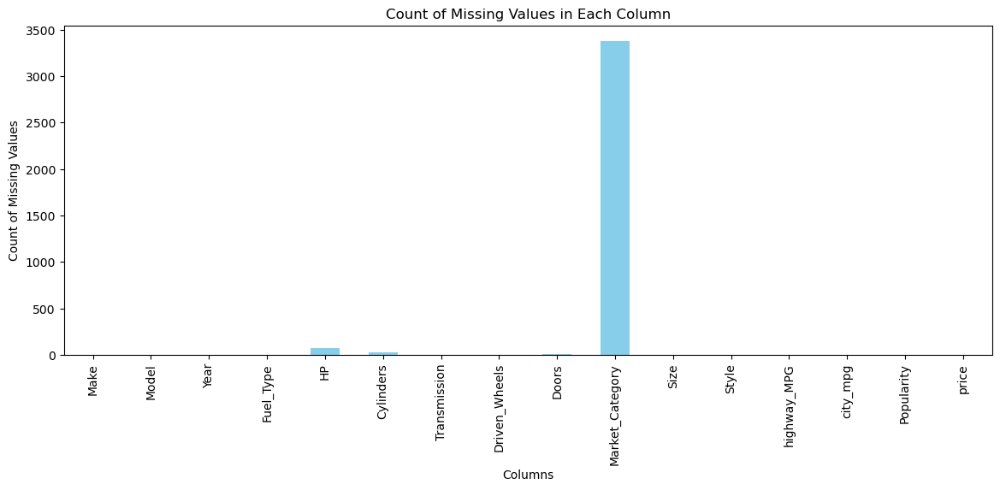

In [23]:
# Calculate the count of missing values in each column
missing_values_count = data.isnull().sum()

# Plot missing values using a bar graph
plt.figure(figsize=(14, 5))
missing_values_count.plot(kind='bar', color='skyblue')
plt.title('Count of Missing Values in Each Column')
plt.xlabel('Columns')
plt.ylabel('Count of Missing Values')
plt.xticks(rotation=90) ##alignment of row names 
plt.show()


 market category has more null values compare to other features or columns like HP, Cylinders, Doors etc.


### Handling null values

In [24]:
data=data.replace(" ",np.NaN)
data

,Make,Model,Year,Fuel_Type,HP,Cylinders,Transmission,Driven_Wheels,Doors,Market_Category,Size,Style,highway_MPG,city_mpg,Popularity,price
0,BMW,1_Series_M,2011,premium_unleaded_(required),335.0,6.0,MANUAL,rear_wheel_drive,2.0,"Factory_Tuner,Luxury,High-Performance",Compact,Coupe,26,19,3916,46135
1,BMW,1_Series,2011,premium_unleaded_(required),300.0,6.0,MANUAL,rear_wheel_drive,2.0,"Luxury,Performance",Compact,Convertible,28,19,3916,40650
2,BMW,1_Series,2011,premium_unleaded_(required),300.0,6.0,MANUAL,rear_wheel_drive,2.0,"Luxury,High-Performance",Compact,Coupe,28,20,3916,36350
3,BMW,1_Series,2011,premium_unleaded_(required),230.0,6.0,MANUAL,rear_wheel_drive,2.0,"Luxury,Performance",Compact,Coupe,28,18,3916,29450
4,BMW,1_Series,2011,premium_unleaded_(required),230.0,6.0,MANUAL,rear_wheel_drive,2.0,Luxury,Compact,Convertible,28,18,3916,34500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11194,Acura,ZDX,2012,premium_unleaded_(required),300.0,6.0,AUTOMATIC,all_wheel_drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr_Hatchback,23,16,204,46120
11195,Acura,ZDX,2012,premium_unleaded_(required),300.0,6.0,AUTOMATIC,all_wheel_drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr_Hatchback,23,16,204,56670
11196,Acura,ZDX,2012,premium_unleaded_(required),300.0,6.0,AUTOMATIC,all_wheel_drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr_Hatchback,23,16,204,50620
11197,Acura,ZDX,2013,premium_unleaded_(recommended),300.0,6.0,AUTOMATIC,all_wheel_drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr_Hatchback,23,16,204,50920


In [25]:
# drop most null and unwantes column
data.drop(columns=['Market_Category'], inplace=True)
data

,Make,Model,Year,Fuel_Type,HP,Cylinders,Transmission,Driven_Wheels,Doors,Size,Style,highway_MPG,city_mpg,Popularity,price
0,BMW,1_Series_M,2011,premium_unleaded_(required),335.0,6.0,MANUAL,rear_wheel_drive,2.0,Compact,Coupe,26,19,3916,46135
1,BMW,1_Series,2011,premium_unleaded_(required),300.0,6.0,MANUAL,rear_wheel_drive,2.0,Compact,Convertible,28,19,3916,40650
2,BMW,1_Series,2011,premium_unleaded_(required),300.0,6.0,MANUAL,rear_wheel_drive,2.0,Compact,Coupe,28,20,3916,36350
3,BMW,1_Series,2011,premium_unleaded_(required),230.0,6.0,MANUAL,rear_wheel_drive,2.0,Compact,Coupe,28,18,3916,29450
4,BMW,1_Series,2011,premium_unleaded_(required),230.0,6.0,MANUAL,rear_wheel_drive,2.0,Compact,Convertible,28,18,3916,34500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11194,Acura,ZDX,2012,premium_unleaded_(required),300.0,6.0,AUTOMATIC,all_wheel_drive,4.0,Midsize,4dr_Hatchback,23,16,204,46120
11195,Acura,ZDX,2012,premium_unleaded_(required),300.0,6.0,AUTOMATIC,all_wheel_drive,4.0,Midsize,4dr_Hatchback,23,16,204,56670
11196,Acura,ZDX,2012,premium_unleaded_(required),300.0,6.0,AUTOMATIC,all_wheel_drive,4.0,Midsize,4dr_Hatchback,23,16,204,50620
11197,Acura,ZDX,2013,premium_unleaded_(recommended),300.0,6.0,AUTOMATIC,all_wheel_drive,4.0,Midsize,4dr_Hatchback,23,16,204,50920


In [26]:
# Replace missing categorical values with the most frequent value
fuel=data['Fuel_Type'].mode()[0]
doors=data['Doors'].mode()[0]
data['Fuel_Type'].fillna(fuel, inplace=True)
data['Doors'].fillna(doors, inplace=True)

In [27]:
# replace missing numerical values with mean
data['HP'].fillna(data['HP'].mean(), inplace=True)
data['Cylinders'].fillna(data['Cylinders'].mean(), inplace=True)

In [28]:
# Confirm there are no more missing values
print(data.isnull().sum())

Make             0
Model            0
Year             0
Fuel_Type        0
HP               0
Cylinders        0
Transmission     0
Driven_Wheels    0
Doors            0
Size             0
Style            0
highway_MPG      0
city_mpg         0
Popularity       0
price            0
dtype: int64


There is no missing or null values in the dataset


In [29]:
data.describe()

,Year,HP,Cylinders,Doors,highway_MPG,city_mpg,Popularity,price
count,11199.000000,11199.000000,11199.000000,11199.000000,11199.000000,11199.000000,11199.000000,1.119900e+04
mean,2010.714528,253.388859,5.665950,3.454416,26.610590,19.731851,1558.483347,4.192593e+04
std,7.228211,109.811049,1.794613,0.872804,8.977641,9.177555,1445.668872,6.153505e+04
min,1990.000000,55.000000,0.000000,2.000000,12.000000,7.000000,2.000000,2.000000e+03
25%,2007.000000,172.000000,4.000000,2.000000,22.000000,16.000000,549.000000,2.159950e+04
50%,2015.000000,240.000000,6.000000,4.000000,25.000000,18.000000,1385.000000,3.067500e+04
75%,2016.000000,303.000000,6.000000,4.000000,30.000000,22.000000,2009.000000,4.303250e+04
max,2017.000000,1001.000000,16.000000,4.000000,354.000000,137.000000,5657.000000,2.065902e+06


In [30]:
data.describe(include="object")

,Make,Model,Fuel_Type,Transmission,Driven_Wheels,Size,Style
count,11199,11199,11199,11199,11199,11199,11199
unique,48,915,10,5,4,3,16
top,Chevrolet,Silverado_1500,regular_unleaded,AUTOMATIC,front_wheel_drive,Compact,Sedan
freq,1083,156,6661,7932,4354,4395,2843


###  Data Visualization

### Get to know the value counts of each value/comparision in the dataset

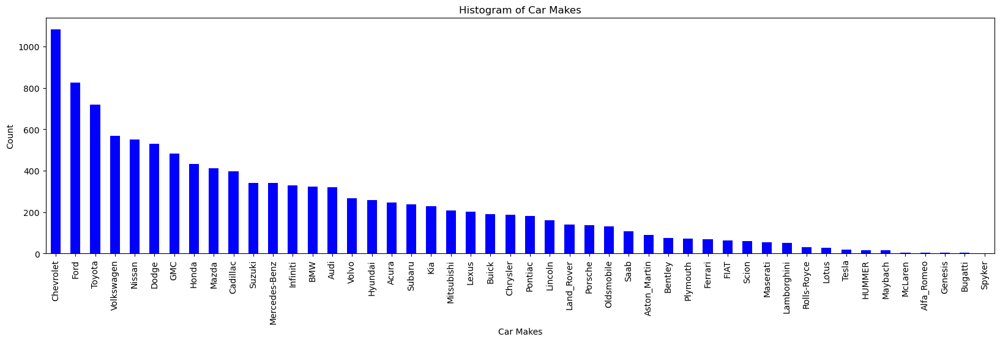

In [31]:
plt.figure(figsize=(20, 5))
data['Make'].value_counts().plot(kind='bar', color='blue')
plt.title('Histogram of Car Makes')
plt.xlabel('Car Makes')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

In [42]:
# all count plots/histogram plots in one code
from plotly.express import histogram

for key, value in data.nunique().to_dict().items():
    if value < 50:
        histogram(data_frame=data, x=key).show()
## px.histogram(data,x="Make").show() use this code for single/particular plot/column.

In [43]:
## to get only the makers of BMW
bmw_df = data[data['Make'] == 'BMW']
bmw_df

,Make,Model,Year,Fuel_Type,HP,Cylinders,Transmission,Driven_Wheels,Doors,Size,Style,highway_MPG,city_mpg,Popularity,price
0,BMW,1_Series_M,2011,premium_unleaded_(required),335.0,6.0,MANUAL,rear_wheel_drive,2.0,Compact,Coupe,26,19,3916,46135
1,BMW,1_Series,2011,premium_unleaded_(required),300.0,6.0,MANUAL,rear_wheel_drive,2.0,Compact,Convertible,28,19,3916,40650
2,BMW,1_Series,2011,premium_unleaded_(required),300.0,6.0,MANUAL,rear_wheel_drive,2.0,Compact,Coupe,28,20,3916,36350
3,BMW,1_Series,2011,premium_unleaded_(required),230.0,6.0,MANUAL,rear_wheel_drive,2.0,Compact,Coupe,28,18,3916,29450
4,BMW,1_Series,2011,premium_unleaded_(required),230.0,6.0,MANUAL,rear_wheel_drive,2.0,Compact,Convertible,28,18,3916,34500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11186,BMW,Z4,2016,premium_unleaded_(required),240.0,4.0,MANUAL,rear_wheel_drive,2.0,Compact,Convertible,34,22,3916,49700
11187,BMW,Z4,2016,premium_unleaded_(required),335.0,6.0,AUTOMATED_MANUAL,rear_wheel_drive,2.0,Compact,Convertible,24,17,3916,66350
11188,BMW,Z8,2001,premium_unleaded_(required),394.0,8.0,MANUAL,rear_wheel_drive,2.0,Compact,Convertible,19,12,3916,128000
11189,BMW,Z8,2002,premium_unleaded_(required),394.0,8.0,MANUAL,rear_wheel_drive,2.0,Compact,Convertible,19,12,3916,130000


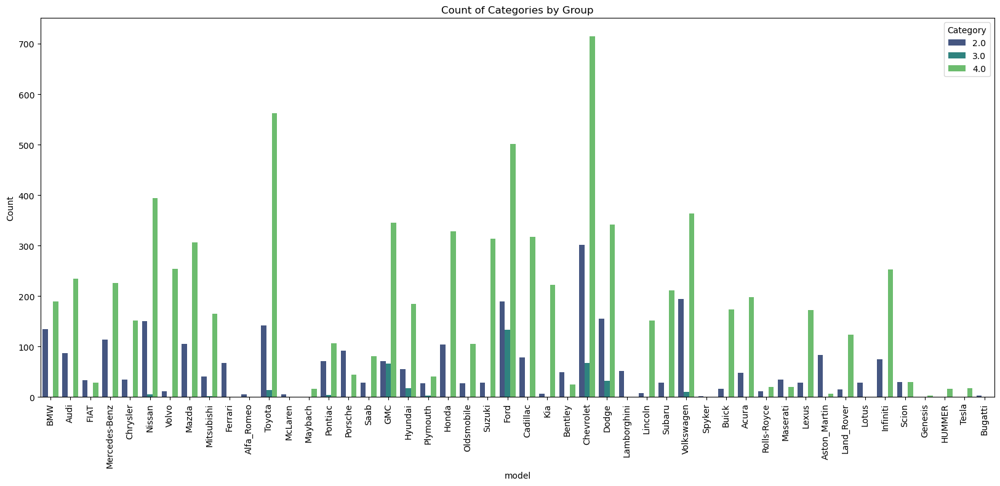

In [47]:
plt.figure(figsize=(20, 8))
sns.countplot(x='Make', hue='Doors', data=data, palette='viridis')
plt.title('Count of Categories by Group')
plt.xlabel('model')
plt.ylabel('Count')
plt.legend(title='Category')
plt.xticks(rotation=90)
plt.show()

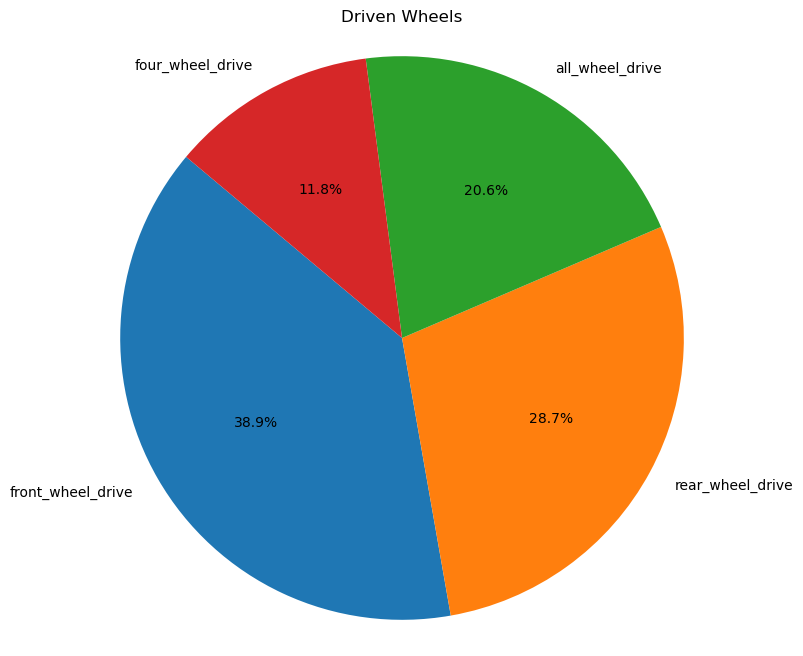

In [51]:
car_data=data['Driven_Wheels']
size_counts =data['Driven_Wheels'].value_counts()
plt.figure(figsize=(8, 8)) 
plt.pie(size_counts, labels=size_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Driven Wheels')  
plt.axis('equal')
plt.show()

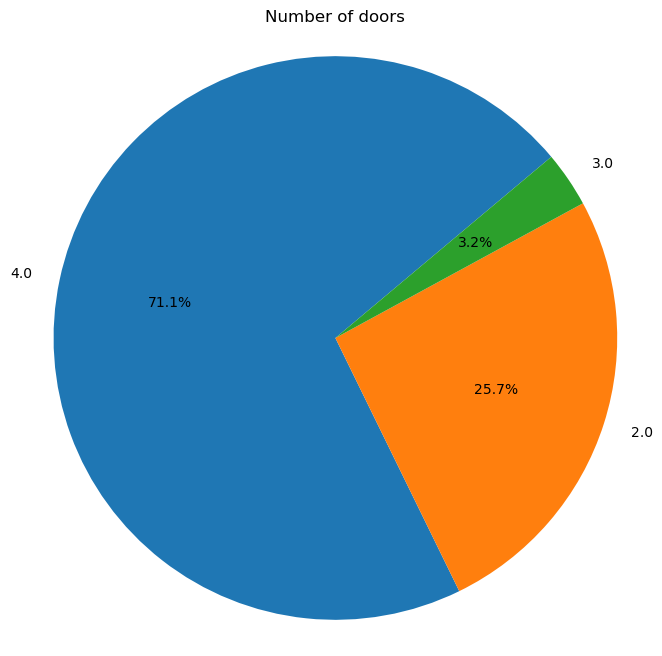

In [53]:
car_data=data['Doors']
size_counts =data['Doors'].value_counts()
plt.figure(figsize=(8, 8)) 
plt.pie(size_counts, labels=size_counts.index, autopct='%1.1f%%', startangle=40)
plt.title('Number of doors')  
plt.axis('equal')
plt.show()

#### numerical vs categorical

In [54]:
# average popularity of car makers
px.histogram(data,x="Make",y="Popularity",histfunc='avg').show()

In [55]:
# average price of a car based on data
px.histogram(data,x="Make",y=data['price'],histfunc='avg').show()

In [56]:
## average highway_MPG
px.histogram(data,x="Make",y="highway_MPG",histfunc='avg').show()

In [58]:
## to show which model in BMW gives more milage on highway
bmw_df = data[data['Make'] == 'BMW']
px.histogram(bmw_df,x="Model",y="highway_MPG",histfunc='avg').show()

In [59]:
## to show which model in BMW gives more milage on city
px.histogram(bmw_df,x="Model",y="city_mpg",histfunc='avg').show()

In [60]:
# average HP
px.histogram(data,x="Make",y="HP",histfunc='avg').show()

## relationship of Numerical Variables with dependent variable

In [61]:
# Assuming you want to visualize the relationship between 'HP' and 'Price'
fig = px.scatter(data, x='HP', y='price', title='Scatter Plot of HP vs PRICE',hover_name='Make')
# Show the plot
fig.show()

There appears to be a moderate negative correlation between highway_MPG and price. This means that as the highway_MPG of a car increases, its price tends to decrease, but the relationship is not very strong.

In [62]:
fig = px.scatter(data, x='highway_MPG', y='price', title='Scatter Plot of Highway_mpg vs PRICE',hover_name='Make')
fig.show()


There appears to be a moderate negative correlation between highway_MPG and price. This means that as the highway_MPG of a car increases, its price tends to decrease, but the relationship is not very strong. There are some outliers, particularly data points in the bottom right corner with low highway_MPG and high prices. These could represent high-performance cars or SUVs, which often have lower fuel efficiency but also higher price tags.

In [63]:
fig = px.scatter(data, x='city_mpg', y='price', title='Scatter Plot of city_mpg vs PRICE',hover_name='Make')
fig.show()

There appears to be a weak negative correlation between price and city_mpg. This means that as the price of a car increases, its city_mpg tends to decrease, but the relationship is not very strong.
There are several outliers, particularly data points in the top right corner with high prices and high city_mpg. These could represent hybrid or electric cars, which are often more expensive but also more fuel-efficient.


In [64]:
fig = px.scatter(data, x='Popularity', y='price', title='Scatter Plot of city_mpg vs PRICE',hover_name='Make')
fig.show()

In [65]:
data.drop(columns=['Popularity'], inplace=True)
data

,Make,Model,Year,Fuel_Type,HP,Cylinders,Transmission,Driven_Wheels,Doors,Size,Style,highway_MPG,city_mpg,price
0,BMW,1_Series_M,2011,premium_unleaded_(required),335.0,6.0,MANUAL,rear_wheel_drive,2.0,Compact,Coupe,26,19,46135
1,BMW,1_Series,2011,premium_unleaded_(required),300.0,6.0,MANUAL,rear_wheel_drive,2.0,Compact,Convertible,28,19,40650
2,BMW,1_Series,2011,premium_unleaded_(required),300.0,6.0,MANUAL,rear_wheel_drive,2.0,Compact,Coupe,28,20,36350
3,BMW,1_Series,2011,premium_unleaded_(required),230.0,6.0,MANUAL,rear_wheel_drive,2.0,Compact,Coupe,28,18,29450
4,BMW,1_Series,2011,premium_unleaded_(required),230.0,6.0,MANUAL,rear_wheel_drive,2.0,Compact,Convertible,28,18,34500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11194,Acura,ZDX,2012,premium_unleaded_(required),300.0,6.0,AUTOMATIC,all_wheel_drive,4.0,Midsize,4dr_Hatchback,23,16,46120
11195,Acura,ZDX,2012,premium_unleaded_(required),300.0,6.0,AUTOMATIC,all_wheel_drive,4.0,Midsize,4dr_Hatchback,23,16,56670
11196,Acura,ZDX,2012,premium_unleaded_(required),300.0,6.0,AUTOMATIC,all_wheel_drive,4.0,Midsize,4dr_Hatchback,23,16,50620
11197,Acura,ZDX,2013,premium_unleaded_(recommended),300.0,6.0,AUTOMATIC,all_wheel_drive,4.0,Midsize,4dr_Hatchback,23,16,50920


In [66]:
numerical_feature=data[['HP','highway_MPG','city_mpg','Cylinders','Year','price']]
numerical_feature

,HP,highway_MPG,city_mpg,Cylinders,Year,price
0,335.0,26,19,6.0,2011,46135
1,300.0,28,19,6.0,2011,40650
2,300.0,28,20,6.0,2011,36350
3,230.0,28,18,6.0,2011,29450
4,230.0,28,18,6.0,2011,34500
...,...,...,...,...,...,...
11194,300.0,23,16,6.0,2012,46120
11195,300.0,23,16,6.0,2012,56670
11196,300.0,23,16,6.0,2012,50620
11197,300.0,23,16,6.0,2013,50920


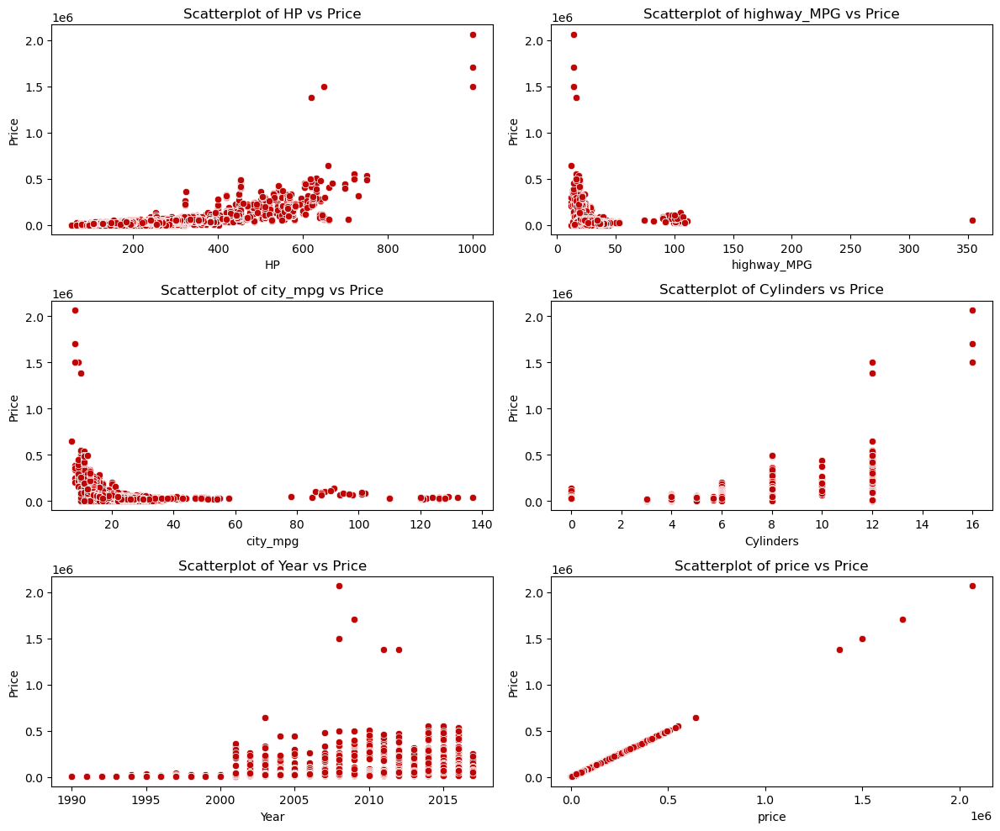

In [67]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define the number of rows and columns for subplots
nrows = 3
ncols = 2

# Create a figure and a grid of subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, 10))

# Flatten the axes array to iterate over it easily
axes = axes.flatten()

# Iterate through numerical features and plot each one on a subplot
for i, feature in enumerate(numerical_feature):
    sns.scatterplot(data=data, x=feature, y='price', ax=axes[i], color='#bf0606')
    axes[i].set_title(f"Scatterplot of {feature} vs Price")
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('Price')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


# Encoding 


In [68]:
from sklearn.preprocessing import PolynomialFeatures

In [69]:
### or use replace method based on counts
## label encoading
# LE = preprocessing.LabelEncoder()
# data['HP'] = LE.fit_transform(data.HP)

In [70]:
categorical = list(data.dtypes[data.dtypes == 'object'].index)
categorical

['Make',
 'Model',
 'Fuel_Type',
 'Transmission',
 'Driven_Wheels',
 'Size',
 'Style']

In [71]:
#data['car_name'] = data['Make'].astype(str) + ' '+data['Model'].astype(str)
#data['car_name'] 

In [72]:
#data.drop(columns=['Make', 'Model'], inplace=True)

In [73]:
#data

### For Fuel_Type

In [74]:
# Calculate value counts of the categorical column
value_counts_fuel = data['Fuel_Type'].value_counts()

# Create a dictionary mapping categories to numerical values based on counts
value_mapping = {Fuel_Type:  len(value_counts_fuel) - i  for i,Fuel_Type  in enumerate(value_counts_fuel.index)}


# Replace categorical values with numerical values based on the dictionary
data['Fuel_Type'] = data['Fuel_Type'].replace(value_mapping)


In [75]:
value_counts_fuel

regular_unleaded                                6661
premium_unleaded_(required)                     1956
premium_unleaded_(recommended)                  1392
flex-fuel_(unleaded/E85)                         887
diesel                                           150
electric                                          66
flex-fuel_(premium_unleaded_required/E85)         53
flex-fuel_(premium_unleaded_recommended/E85)      26
flex-fuel_(unleaded/natural_gas)                   6
natural_gas                                        2
Name: Fuel_Type, dtype: int64

### For Transmission

In [76]:
# Calculate value counts of the categorical column
value_counts_Transmission = data['Transmission'].value_counts()

# Create a dictionary mapping categories to numerical values based on counts
value_mapping = {Transmission:  len(value_counts_Transmission) - i  for i,Transmission  in enumerate(value_counts_Transmission.index)}


# Replace categorical values with numerical values based on the dictionary
data['Transmission'] = data['Transmission'].replace(value_mapping)



In [77]:
value_counts_Transmission

AUTOMATIC           7932
MANUAL              2634
AUTOMATED_MANUAL     553
DIRECT_DRIVE          68
UNKNOWN               12
Name: Transmission, dtype: int64

### For Driven_Wheels

In [78]:
# Calculate value counts of the categorical column
value_counts_Driven_Wheels = data['Driven_Wheels'].value_counts()

# Create a dictionary mapping categories to numerical values based on counts
value_mapping = {Driven_Wheels:  len(value_counts_Driven_Wheels) - i  for i,Driven_Wheels  in enumerate(value_counts_Driven_Wheels.index)}


# Replace categorical values with numerical values based on the dictionary
data['Driven_Wheels'] = data['Driven_Wheels'].replace(value_mapping)


In [79]:
value_counts_Driven_Wheels

front_wheel_drive    4354
rear_wheel_drive     3212
all_wheel_drive      2308
four_wheel_drive     1325
Name: Driven_Wheels, dtype: int64

### For Size

In [80]:
value_counts_Size = data['Size'].value_counts()

# Create a dictionary mapping categories to numerical values based on counts
value_mapping = {Size:  len(value_counts_Size) - i  for i,Size  in enumerate(value_counts_Size.index)}


# Replace categorical values with numerical values based on the dictionary
data['Size'] = data['Size'].replace(value_mapping)

 

In [81]:
value_counts_Size

Compact    4395
Midsize    4121
Large      2683
Name: Size, dtype: int64

In [82]:
# data['Size '] = data['Size'].replace({
#    'Compact ' : 2,
#    'Midsize ' : 1,
#    'Large' : 0})

### For Style

In [83]:
# Calculate value counts of the categorical column
value_counts_Style = data['Style'].value_counts()

# Create a dictionary mapping categories to numerical values based on counts
value_mapping = {Style:  len(value_counts_Style) - i  for i,Style  in enumerate(value_counts_Style.index)}


# Replace categorical values with numerical values based on the dictionary
data['Style'] = data['Style'].replace(value_mapping)

value_mapping 

{'Sedan': 16,
 '4dr_SUV': 15,
 'Coupe': 14,
 'Convertible': 13,
 '4dr_Hatchback': 12,
 'Crew_Cab_Pickup': 11,
 'Extended_Cab_Pickup': 10,
 'Wagon': 9,
 '2dr_Hatchback': 8,
 'Passenger_Minivan': 7,
 'Regular_Cab_Pickup': 6,
 'Passenger_Van': 5,
 '2dr_SUV': 4,
 'Cargo_Van': 3,
 'Cargo_Minivan': 2,
 'Convertible_SUV': 1}

In [84]:
value_counts_Style

Sedan                  2843
4dr_SUV                2434
Coupe                  1175
Convertible             741
4dr_Hatchback           663
Crew_Cab_Pickup         655
Extended_Cab_Pickup     597
Wagon                   562
2dr_Hatchback           412
Passenger_Minivan       389
Regular_Cab_Pickup      345
Passenger_Van           121
2dr_SUV                  91
Cargo_Van                84
Cargo_Minivan            59
Convertible_SUV          28
Name: Style, dtype: int64

In [85]:
data ## encoded data

,Make,Model,Year,Fuel_Type,HP,Cylinders,Transmission,Driven_Wheels,Doors,Size,Style,highway_MPG,city_mpg,price
0,BMW,1_Series_M,2011,9,335.0,6.0,4,3,2.0,3,14,26,19,46135
1,BMW,1_Series,2011,9,300.0,6.0,4,3,2.0,3,13,28,19,40650
2,BMW,1_Series,2011,9,300.0,6.0,4,3,2.0,3,14,28,20,36350
3,BMW,1_Series,2011,9,230.0,6.0,4,3,2.0,3,14,28,18,29450
4,BMW,1_Series,2011,9,230.0,6.0,4,3,2.0,3,13,28,18,34500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11194,Acura,ZDX,2012,9,300.0,6.0,5,2,4.0,2,12,23,16,46120
11195,Acura,ZDX,2012,9,300.0,6.0,5,2,4.0,2,12,23,16,56670
11196,Acura,ZDX,2012,9,300.0,6.0,5,2,4.0,2,12,23,16,50620
11197,Acura,ZDX,2013,8,300.0,6.0,5,2,4.0,2,12,23,16,50920


## Checking for normality
* based on plot/graph
* based on skewness(value between -0.5 to 0.5) 
* based on some tests like shapiro(p value > 0.5) etc

In [86]:
data

,Make,Model,Year,Fuel_Type,HP,Cylinders,Transmission,Driven_Wheels,Doors,Size,Style,highway_MPG,city_mpg,price
0,BMW,1_Series_M,2011,9,335.0,6.0,4,3,2.0,3,14,26,19,46135
1,BMW,1_Series,2011,9,300.0,6.0,4,3,2.0,3,13,28,19,40650
2,BMW,1_Series,2011,9,300.0,6.0,4,3,2.0,3,14,28,20,36350
3,BMW,1_Series,2011,9,230.0,6.0,4,3,2.0,3,14,28,18,29450
4,BMW,1_Series,2011,9,230.0,6.0,4,3,2.0,3,13,28,18,34500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11194,Acura,ZDX,2012,9,300.0,6.0,5,2,4.0,2,12,23,16,46120
11195,Acura,ZDX,2012,9,300.0,6.0,5,2,4.0,2,12,23,16,56670
11196,Acura,ZDX,2012,9,300.0,6.0,5,2,4.0,2,12,23,16,50620
11197,Acura,ZDX,2013,8,300.0,6.0,5,2,4.0,2,12,23,16,50920


In [87]:
data.HP.skew()

1.2503343358475343

In [88]:
data.price.skew()

11.609709303878942

In [89]:

data.city_mpg.skew()

7.093660103761327

In [90]:
from scipy import stats

In [91]:
stats.shapiro(data['HP'])

ShapiroResult(statistic=0.9170916080474854, pvalue=0.0)

<Axes: xlabel='HP', ylabel='Density'>

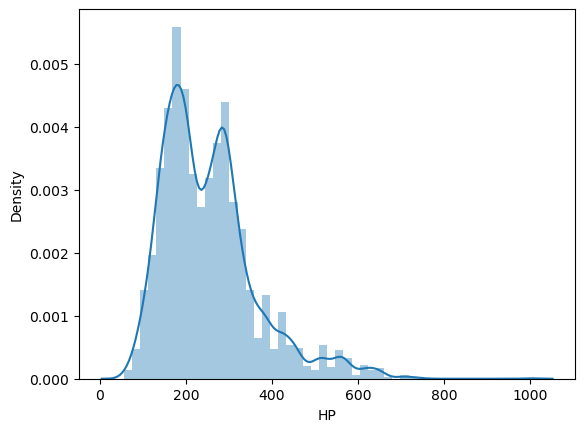

In [92]:
sns.distplot(data['HP'])

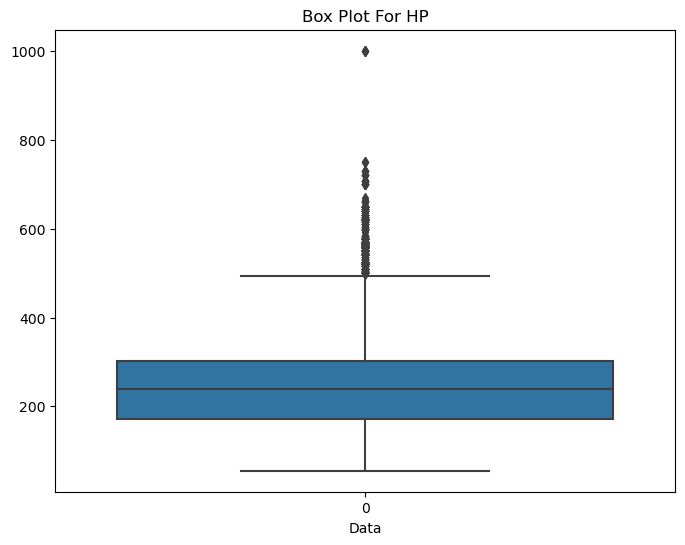

In [93]:
plt.figure(figsize=(8, 6))
sns.boxplot(data=data['HP'], whis=1.5)  # Increase whis to extend the whiskers
plt.title('Box Plot For HP')
plt.xlabel('Data')
plt.show()

In [94]:
# data[data.HP>600]

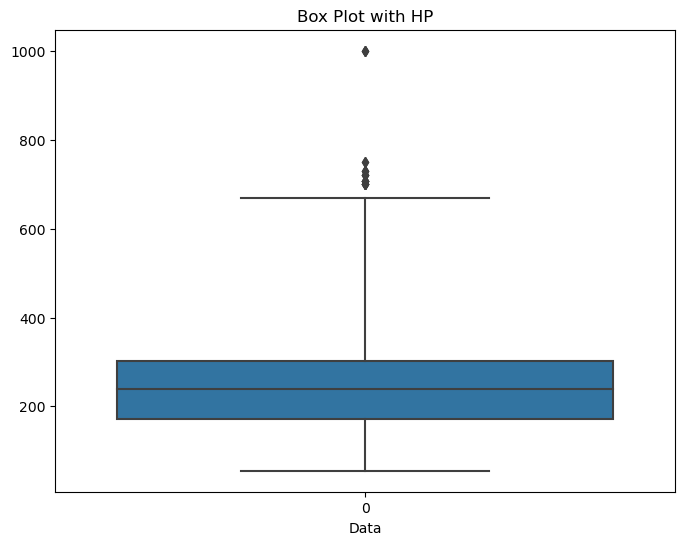

In [95]:
plt.figure(figsize=(8, 6))
sns.boxplot(data=data['HP'], whis=2.9)  # Increase whis to extend the whiskers
plt.title('Box Plot with HP')
plt.xlabel('Data')
plt.show()

indicates presence of outliers

In [96]:
# Calculate quartiles
outlier_multiplier = 1.5  
q1 = data['HP'].quantile(0.25)
q3 = data['HP'].quantile(0.75)

# Calculate interquartile range (IQR)
iqr = q3 - q1

# Define lower and upper bounds
lower_bound = q1 - outlier_multiplier * iqr
upper_bound = q3 + outlier_multiplier * iqr

# Identify outliers
outliers = data[(data['HP'] < lower_bound) | (data["HP"] > upper_bound)]
print("the total number of outlier is:",len(outliers))
print(f"Lower bound: {lower_bound}")
print(f"Upper bound: {upper_bound}")

the total number of outlier is: 502
Lower bound: -24.5
Upper bound: 499.5


In [97]:
## copy of data

In [98]:
df=data.copy()
df

,Make,Model,Year,Fuel_Type,HP,Cylinders,Transmission,Driven_Wheels,Doors,Size,Style,highway_MPG,city_mpg,price
0,BMW,1_Series_M,2011,9,335.0,6.0,4,3,2.0,3,14,26,19,46135
1,BMW,1_Series,2011,9,300.0,6.0,4,3,2.0,3,13,28,19,40650
2,BMW,1_Series,2011,9,300.0,6.0,4,3,2.0,3,14,28,20,36350
3,BMW,1_Series,2011,9,230.0,6.0,4,3,2.0,3,14,28,18,29450
4,BMW,1_Series,2011,9,230.0,6.0,4,3,2.0,3,13,28,18,34500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11194,Acura,ZDX,2012,9,300.0,6.0,5,2,4.0,2,12,23,16,46120
11195,Acura,ZDX,2012,9,300.0,6.0,5,2,4.0,2,12,23,16,56670
11196,Acura,ZDX,2012,9,300.0,6.0,5,2,4.0,2,12,23,16,50620
11197,Acura,ZDX,2013,8,300.0,6.0,5,2,4.0,2,12,23,16,50920


In [99]:
from sklearn import preprocessing
PT = preprocessing.PowerTransformer()

df['price']=PT.fit_transform(df[['price']])
df

,Make,Model,Year,Fuel_Type,HP,Cylinders,Transmission,Driven_Wheels,Doors,Size,Style,highway_MPG,city_mpg,price
0,BMW,1_Series_M,2011,9,335.0,6.0,4,3,2.0,3,14,26,19,0.487897
1,BMW,1_Series,2011,9,300.0,6.0,4,3,2.0,3,13,28,19,0.348833
2,BMW,1_Series,2011,9,300.0,6.0,4,3,2.0,3,14,28,20,0.228945
3,BMW,1_Series,2011,9,230.0,6.0,4,3,2.0,3,14,28,18,0.010511
4,BMW,1_Series,2011,9,230.0,6.0,4,3,2.0,3,13,28,18,0.173864
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11194,Acura,ZDX,2012,9,300.0,6.0,5,2,4.0,2,12,23,16,0.487535
11195,Acura,ZDX,2012,9,300.0,6.0,5,2,4.0,2,12,23,16,0.721663
11196,Acura,ZDX,2012,9,300.0,6.0,5,2,4.0,2,12,23,16,0.592131
11197,Acura,ZDX,2013,8,300.0,6.0,5,2,4.0,2,12,23,16,0.598837


In [100]:
df['price'].skew()

0.12358563115752946

In [101]:
PT = preprocessing.PowerTransformer()

df['HP']=PT.fit_transform(df[['HP']])

In [102]:
df['HP'].skew()

0.0003155509215687721

In [103]:
PT = preprocessing.PowerTransformer()

df['city_mpg']=PT.fit_transform(df[['city_mpg']])

In [104]:
df['city_mpg'].skew()

-0.0910520714611463

In [105]:
PT = preprocessing.PowerTransformer()

df['highway_MPG']=PT.fit_transform(df[['highway_MPG']])

In [106]:
df['highway_MPG'].skew()

-0.052048654265000355

In [107]:
PT = preprocessing.PowerTransformer()

df['Cylinders']=PT.fit_transform(df[['Cylinders']])

In [108]:
df['Cylinders'].skew()

0.1180483987472711

In [109]:
df

,Make,Model,Year,Fuel_Type,HP,Cylinders,Transmission,Driven_Wheels,Doors,Size,Style,highway_MPG,city_mpg,price
0,BMW,1_Series_M,2011,9,0.880583,0.261452,4,3,2.0,3,14,0.130467,0.177174,0.487897
1,BMW,1_Series,2011,9,0.616710,0.261452,4,3,2.0,3,13,0.415703,0.177174,0.348833
2,BMW,1_Series,2011,9,0.616710,0.261452,4,3,2.0,3,14,0.415703,0.357322,0.228945
3,BMW,1_Series,2011,9,-0.020907,0.261452,4,3,2.0,3,14,0.415703,-0.020667,0.010511
4,BMW,1_Series,2011,9,-0.020907,0.261452,4,3,2.0,3,13,0.415703,-0.020667,0.173864
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11194,Acura,ZDX,2012,9,0.616710,0.261452,5,2,4.0,2,12,-0.368699,-0.481325,0.487535
11195,Acura,ZDX,2012,9,0.616710,0.261452,5,2,4.0,2,12,-0.368699,-0.481325,0.721663
11196,Acura,ZDX,2012,9,0.616710,0.261452,5,2,4.0,2,12,-0.368699,-0.481325,0.592131
11197,Acura,ZDX,2013,8,0.616710,0.261452,5,2,4.0,2,12,-0.368699,-0.481325,0.598837


In [110]:
df['age']=2024-df['Year']
df.drop(columns=['Year'], inplace=True)
df

,Make,Model,Fuel_Type,HP,Cylinders,Transmission,Driven_Wheels,Doors,Size,Style,highway_MPG,city_mpg,price,age
0,BMW,1_Series_M,9,0.880583,0.261452,4,3,2.0,3,14,0.130467,0.177174,0.487897,13
1,BMW,1_Series,9,0.616710,0.261452,4,3,2.0,3,13,0.415703,0.177174,0.348833,13
2,BMW,1_Series,9,0.616710,0.261452,4,3,2.0,3,14,0.415703,0.357322,0.228945,13
3,BMW,1_Series,9,-0.020907,0.261452,4,3,2.0,3,14,0.415703,-0.020667,0.010511,13
4,BMW,1_Series,9,-0.020907,0.261452,4,3,2.0,3,13,0.415703,-0.020667,0.173864,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11194,Acura,ZDX,9,0.616710,0.261452,5,2,4.0,2,12,-0.368699,-0.481325,0.487535,12
11195,Acura,ZDX,9,0.616710,0.261452,5,2,4.0,2,12,-0.368699,-0.481325,0.721663,12
11196,Acura,ZDX,9,0.616710,0.261452,5,2,4.0,2,12,-0.368699,-0.481325,0.592131,12
11197,Acura,ZDX,8,0.616710,0.261452,5,2,4.0,2,12,-0.368699,-0.481325,0.598837,11


In [111]:
PT = preprocessing.PowerTransformer()

df['age']=PT.fit_transform(df[['age']])


In [112]:
df['age'].skew()

0.2701937908315841

## Hypothesis for normality test

Null Hypothesis (H0): The data is normally distributed.

Alternative Hypothesis (H1): The data is not normally distributed.

During hypothesis testing, if the p-value obtained from the normality test is less than the chosen significance level (usually 0.05)

we reject the null hypothesis in favor of the alternative hypothesis. This indicates that there is sufficient evidence to conclude that the data significantly deviates from a normal distribution.

In [113]:
## if p value greater than 0.05 then the data follow normal or data is normally distributed

In [114]:
# Randomly select a sample from the dataset
sample_size = 30
sample = np.random.choice(df['HP'],sample_size, replace=False)

# Perform the Shapiro-Wilk test
statistic, p_value = stats.shapiro(sample)
alpha = 0.05
if p_value > alpha:
    print("Sample looks Gaussian (fail to reject H0)")
else:
    print("Sample does not look Gaussian (reject H0)")
    
print(p_value)

Sample looks Gaussian (fail to reject H0)
0.07851414382457733


In [115]:
np.random.seed(20)
sample_size = 30
sample = np.random.choice(df['HP'],sample_size, replace=False)

# Perform the Shapiro-Wilk test
statistic, p_value = stats.shapiro(sample)
alpha = 0.05
if p_value > alpha:
    print("Sample looks Gaussian (fail to reject H0)")
else:
    print("Sample does not look Gaussian (reject H0)")
    
print(p_value)

Sample looks Gaussian (fail to reject H0)
0.14847658574581146


In [116]:
np.random.seed(20)
sample_size = 30
sample = np.random.choice(df['highway_MPG'],sample_size, replace=False)

# Perform the Shapiro-Wilk test
statistic, p_value = stats.shapiro(sample)
alpha = 0.05
if p_value > alpha:
    print("Sample looks Gaussian (fail to reject H0)")
else:
    print("Sample does not look Gaussian (reject H0)")
    
print(p_value)

Sample looks Gaussian (fail to reject H0)
0.2705439031124115


In [117]:
np.random.seed(20)
sample_size = 30
sample = np.random.choice(df['city_mpg'],sample_size, replace=False)

# Perform the Shapiro-Wilk test
statistic, p_value = stats.shapiro(sample)
alpha = 0.05
if p_value > alpha:
    print("Sample looks Gaussian (fail to reject H0)")
else:
    print("Sample does not look Gaussian (reject H0)")
    
print(p_value)

Sample looks Gaussian (fail to reject H0)
0.8313012719154358


In [118]:
np.random.seed(20)
sample_size = 30
sample = np.random.choice(df['price'],sample_size, replace=False)

# Perform the Shapiro-Wilk test
statistic, p_value = stats.shapiro(sample)
alpha = 0.05
if p_value > alpha:
    print("Sample looks Gaussian (fail to reject H0)")
else:
    print("Sample does not look Gaussian (reject H0)")
    
print(p_value)

Sample does not look Gaussian (reject H0)
0.01213894970715046


In [119]:
col=df['price']
q25, q75 = np.percentile(df['price'], 25), np.percentile(df['price'], 75) 
iqr = q75 - q25
    
# Calculate outlier cut-off
cut_off = iqr * 1.5
lower, upper = q25 - cut_off, q75 + cut_off

# Identify outliers
outliers = [x for x in df['price'] if x < lower or x > upper]
print(f"Identified {len(outliers)} outliers for '{'price'}'")
# Remove outliers
df = df[~((df['price'] < lower) | (df['price'] > upper))]
print("Removed outliers")
print(df.shape)

Identified 1947 outliers for 'price'
Removed outliers
(9252, 14)


In [120]:
np.random.seed(20)
sample_size = 30
sample = np.random.choice(df['price'],sample_size, replace=False)

# Perform the Shapiro-Wilk test
statistic, p_value = stats.shapiro(sample)
alpha = 0.05
if p_value > alpha:
    print("Sample looks Gaussian (fail to reject H0)")
else:
    print("Sample does not look Gaussian (reject H0)")
    
print(p_value)

Sample looks Gaussian (fail to reject H0)
0.5539105534553528


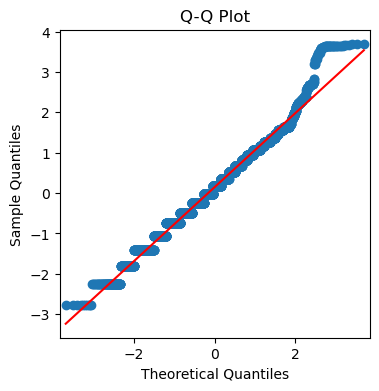

In [121]:
## another method to check normality
## data follows a normal distribution, the points on the Q-Q plot should fall approximately along the diagonal line.
import statsmodels.api as sm
fig, ax = plt.subplots(figsize=(4, 4))
sm.qqplot(df['city_mpg'], line='s', ax=ax)
ax.set_title('Q-Q Plot')
plt.show()

data follows a normal distribution, the points on the Q-Q plot should fall approximately along the diagonal line, where some points lies away from the line.

### Z-test and t-test

#### Z-test for one sample

When you want to compare the mean of a single sample to a known population mean.

Null Hypothesis (H0): The mean of the population is equal to a specified value (μ = μ0).

Alternative Hypothesis (H1): The mean of the population is not equal to the specified value (μ ≠ μ0) or is greater than or less than the specified value (for one-tailed tests).

If the p-value is less than the chosen significance level, reject the null hypothesis. Otherwise, fail to reject the null hypothesis.

In [122]:
df['HP'].mean()

0.0072568467262234555

In [123]:
import numpy as np
from statsmodels.stats.weightstats import ztest
z_stat, pval = ztest(df.HP, value=0.0072)
print(f"Z-statistic: {z_stat}, P-value: {pval}")

Z-statistic: 0.006365302240322734, P-value: 0.9949212579135861


In [124]:
df['price'].mean()

0.1320305532386469

In [125]:
z_stat, pval = ztest(df.price, value=0.132)
print(f"Z-statistic: {z_stat}, P-value: {pval}")

Z-statistic: 0.006657596010020882, P-value: 0.9946880461723764


#### Z-test for two sample
Null Hypothesis (H0): The means of the two populations are equal.

Alternative Hypothesis (H1): The means of the two populations are not equal (two-tailed), or one mean is greater than or less than the other (one-tailed).

If the p-value is less than the chosen significance level, reject the null hypothesis. Otherwise, fail to reject the null hypothesis.

In [126]:
sample1 = df['price']  # Select the 1st variable  from the dataset
sample2 = df['HP']  # Select the  2nd variable  from the dataset
z_statistic, p_value = ztest(sample1, sample2)  # Perform two-sample z-test
print(f"Two-sample z-test - z-statistic: {z_statistic}, p-value: {p_value}")

Two-sample z-test - z-statistic: 12.426601439819215, p-value: 1.8743493550063853e-35


#### t-test for one sample

When you want to compare the mean of a single sample to a known or hypothesized population mean.
 
Null Hypothesis (H0): The mean of the population is equal to a specified value (μ = μ0).

Alternative Hypothesis (H1): The mean of the population is not equal to the specified value (μ ≠ μ0) or is greater than or less than the specified value (for one-tailed tests).

In [127]:
mu_0 = np.mean(df['HP'])

# Perform one-sample t-test
t_statistic, p_value = stats.ttest_1samp(df['HP'], mu_0)

# Print the results
print("One-Sample T-test Results:")
print("T-statistic:", t_statistic)
print("P-value:", p_value)

# Interpret the results
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: the sample mean is significantly different from the population mean.")
else:
    print("Fail to reject the null hypothesis: there is insufficient evidence to suggest that the sample mean differs from the population mean.")

One-Sample T-test Results:
T-statistic: 0.0
P-value: 1.0
Fail to reject the null hypothesis: there is insufficient evidence to suggest that the sample mean differs from the population mean.


In [128]:
mu_0 = np.mean(df['price'])

# Perform one-sample t-test
t_statistic, p_value = stats.ttest_1samp(df['price'], mu_0)

# Print the results
print("One-Sample T-test Results:")
print("T-statistic:", t_statistic)
print("P-value:", p_value)

# Interpret the results
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: the sample mean is significantly different from the population mean.")
else:
    print("Fail to reject the null hypothesis: there is insufficient evidence to suggest that the sample mean differs from the population mean.")

One-Sample T-test Results:
T-statistic: 0.0
P-value: 1.0
Fail to reject the null hypothesis: there is insufficient evidence to suggest that the sample mean differs from the population mean.


#### t-test for two sample

When you want to compare the means of two independent groups to determine if they differ significantly.

null_hypothesis: The population means of the two groups are equal

alternate_hypothesis: The population means of the two groups are not equal 

In [129]:
# Perform two-sample t-test
t_statistic, p_value = stats.ttest_ind(df['HP'], df['price'])

# Print the results
print("Two-Sample T-test Results:")
print("T-statistic:", t_statistic)
print("P-value:", p_value)

# Interpret the results
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: the means of the two groups are significantly different.")
else:
    print("Fail to reject the null hypothesis: there is insufficient evidence to suggest that the means of the two groups differ.")

Two-Sample T-test Results:
T-statistic: -12.426601439819219
P-value: 2.5930292415896307e-35
Reject the null hypothesis: the means of the two groups are significantly different.


## chisquare test

In [130]:
import pandas as pd
from scipy.stats import chi2_contingency

# Create a contingency table
contingency_table = pd.crosstab(data['Fuel_Type'], data['Size'])
print(contingency_table)

# Perform the chi-square test of independence
chi2, p, dof, expected = chi2_contingency(contingency_table)

# Print the test statistics and p-value
print('Chi-square statistic:', chi2)
print('P-value:', p)


Size          1     2     3
Fuel_Type                  
1             0     0     2
2             6     0     0
3             9     9     8
4            26    27     0
5            18     3    45
6            30    62    58
7           599   192    96
8           234   592   566
9           405   849   702
10         1356  2387  2918
Chi-square statistic: 1190.5549616178225
P-value: 1.1813431175416928e-241


Null Hypothesis (H0): There is no association between the type of fuel and the size of the vehicle.

Alternative Hypothesis (H1): There is an association between the type of fuel and the size of the vehicle.

Based on p value , we reject the null hypothesis of independence. This suggests that there is a significant association between 'Fuel_Type' and 'Size'.

In [131]:
df.price

0        0.487897
1        0.348833
2        0.228945
3        0.010511
4        0.173864
           ...   
11194    0.487535
11195    0.721663
11196    0.592131
11197    0.598837
11198   -0.005277
Name: price, Length: 9252, dtype: float64

In [132]:
# Drop missing values
df = df.dropna()

# Convert categorical variables into dummy/indicator variables
df = pd.get_dummies(df, drop_first=True)

# Separate the target variable (MSRP) from the features
X = df.drop('price', axis=1)
y = df['price']

# Perform the statistical analysis
# Add a constant column to the features for the intercept
X = sm.add_constant(X)

# Fit the OLS (Ordinary Least Squares) model
model = sm.OLS(y, X)
results = model.fit()

# Print the summary statistics
print(results.summary())


                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.950
Model:                            OLS   Adj. R-squared:                  0.946
Method:                 Least Squares   F-statistic:                     243.5
Date:                Fri, 01 Mar 2024   Prob (F-statistic):               0.00
Time:                        12:24:09   Log-Likelihood:                 8299.0
No. Observations:                9252   AIC:                        -1.526e+04
Df Residuals:                    8581   BIC:                        -1.047e+04
Df Model:                         670                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const         

In [133]:
#Inference : We know that  Higher the co effecient of a Independent variable,it is that much affecting the target variable.
# Therefore in the above, HP and high_mpg are the key factors that influence Car prices.

In [134]:
data

,Make,Model,Year,Fuel_Type,HP,Cylinders,Transmission,Driven_Wheels,Doors,Size,Style,highway_MPG,city_mpg,price
0,BMW,1_Series_M,2011,9,335.0,6.0,4,3,2.0,3,14,26,19,46135
1,BMW,1_Series,2011,9,300.0,6.0,4,3,2.0,3,13,28,19,40650
2,BMW,1_Series,2011,9,300.0,6.0,4,3,2.0,3,14,28,20,36350
3,BMW,1_Series,2011,9,230.0,6.0,4,3,2.0,3,14,28,18,29450
4,BMW,1_Series,2011,9,230.0,6.0,4,3,2.0,3,13,28,18,34500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11194,Acura,ZDX,2012,9,300.0,6.0,5,2,4.0,2,12,23,16,46120
11195,Acura,ZDX,2012,9,300.0,6.0,5,2,4.0,2,12,23,16,56670
11196,Acura,ZDX,2012,9,300.0,6.0,5,2,4.0,2,12,23,16,50620
11197,Acura,ZDX,2013,8,300.0,6.0,5,2,4.0,2,12,23,16,50920


In [135]:
# Convert the 'Year' column to datetime format
data['Year'] = pd.to_datetime(data['Year'], format='%Y')

# Group the data by year and calculate the average price (MSRP)
average_price = data.groupby(data['Year'].dt.year)['price'].mean()
average_price


Year
1990     2032.272727
1991     2119.029126
1992     2108.346457
1993     2244.693750
1994     2394.271318
1995     2700.128205
1996     2566.565217
1997     3164.644578
1998     3036.151724
1999     3153.850877
2000     3197.104348
2001    41500.666667
2002    33744.156098
2003    39774.063025
2004    36107.336170
2005    36746.971831
2006    32074.850515
2007    35278.404192
2008    56753.838509
2009    50404.447802
2010    52021.117438
2011    57570.003521
2012    61959.133903
2013    51475.760000
2014    65523.254513
2015    47506.329782
2016    47863.957067
2017    42185.156308
Name: price, dtype: float64

In [136]:
#Inference: The interpretation of the output is that there is a fluctuation in average prices over time. The prices start relatively low in the 1990s, gradually increase in the early 2000s with a spike in 2001, and then show fluctuations with some years having higher prices. There is a slight decrease in average prices in 2009-2010, followed by another increase from 2011 to 2014. The average prices then decrease again in the later years, with some variation observed.

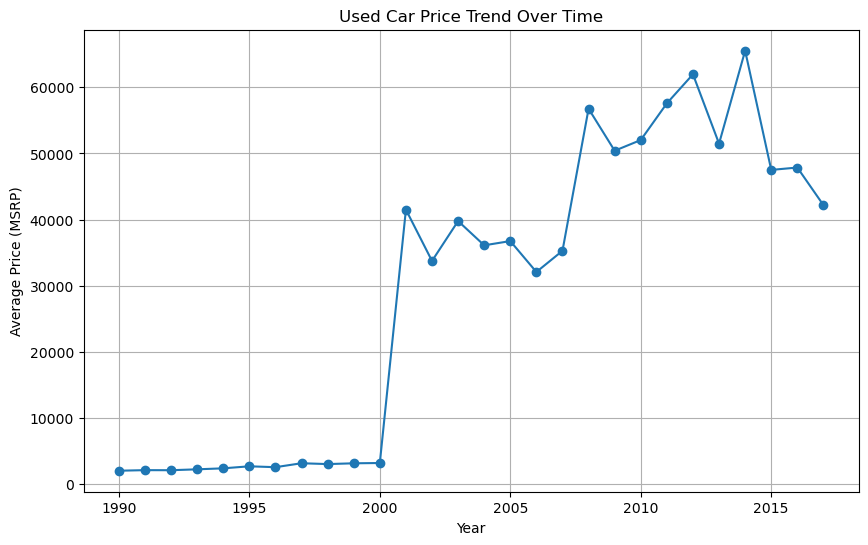

In [137]:
# Plot the price trend
plt.figure(figsize=(10, 6))
plt.plot(average_price.index, average_price.values, marker='o')
plt.xlabel('Year')
plt.ylabel('Average Price (MSRP)')
plt.title('Used Car Price Trend Over Time')
plt.grid(True)
plt.show()

In [138]:
#Interpretation:

In [139]:
# Select the relevant columns for analysis
columns = ['Make', 'Model', 'Style', 'price']
df = data[columns]

# Group the data by make, model, and vehicle style and calculate the average price
average_price = df.groupby(['Make', 'Model', 'Style'])['price'].mean().reset_index()
average_price

,Make,Model,Style,price
0,Acura,CL,14,29818.888889
1,Acura,ILX,16,30712.500000
2,Acura,ILX_Hybrid,16,31750.000000
3,Acura,Integra,8,11967.846154
4,Acura,Integra,16,11533.090909
...,...,...,...,...
1163,Volvo,V90,9,2200.000000
1164,Volvo,XC,9,36500.000000
1165,Volvo,XC60,15,43619.230769
1166,Volvo,XC70,9,40877.777778


In [140]:
#Develop a model to predict used car prices based on key attributes like make, model, year, miles, etc.

In [141]:
import pandas as pd
from statsmodels import api as sm
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Separate the target variable (MSRP) from the features
X = df.drop(columns=['price','Make','Model'], axis=1)
y = df['price']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the linear regression model
model = sm.OLS(y_train,X_train).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                  price   R-squared (uncentered):                   0.348
Model:                            OLS   Adj. R-squared (uncentered):              0.348
Method:                 Least Squares   F-statistic:                              4784.
Date:                Fri, 01 Mar 2024   Prob (F-statistic):                        0.00
Time:                        12:24:13   Log-Likelihood:                     -1.1109e+05
No. Observations:                8959   AIC:                                  2.222e+05
Df Residuals:                    8958   BIC:                                  2.222e+05
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Style       3234.1380     46.758     69.167      0.000    3142.481    3325.795
==============================================================================
Omnibus:                    13954.444   Durbin-Watson:                   2.002
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         13179952.808
Skew:                           9.678   Prob(JB):                         0.00
Kurtosis:                     189.903   Cond. No.                         1.00
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [142]:
# Make predictions on the test set
y_pred = model.predict(X_test)
y_pred

3532     16170.689804
2899     48512.069411
3822     32341.379607
5846     48512.069411
9036     35575.517568
             ...     
2628     35575.517568
8040     51746.207372
10980    48512.069411
447      42043.793490
6535     51746.207372
Length: 2240, dtype: float64

In [143]:
# Calculate the root mean squared error (RMSE)
rmse = mean_squared_error(y_test, y_pred, squared=False)
print("Root Mean Squared Error (RMSE):", rmse)

Root Mean Squared Error (RMSE): 69044.83079584678


In [144]:
#Inference: The Root Mean Squared Error (RMSE) value obtained from the prediction represents the average difference between the actual used car prices and the predicted prices by the linear regression model. In this case, the RMSE value is approximately 69,044.83.

In [145]:
data

,Make,Model,Year,Fuel_Type,HP,Cylinders,Transmission,Driven_Wheels,Doors,Size,Style,highway_MPG,city_mpg,price
0,BMW,1_Series_M,2011-01-01,9,335.0,6.0,4,3,2.0,3,14,26,19,46135
1,BMW,1_Series,2011-01-01,9,300.0,6.0,4,3,2.0,3,13,28,19,40650
2,BMW,1_Series,2011-01-01,9,300.0,6.0,4,3,2.0,3,14,28,20,36350
3,BMW,1_Series,2011-01-01,9,230.0,6.0,4,3,2.0,3,14,28,18,29450
4,BMW,1_Series,2011-01-01,9,230.0,6.0,4,3,2.0,3,13,28,18,34500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11194,Acura,ZDX,2012-01-01,9,300.0,6.0,5,2,4.0,2,12,23,16,46120
11195,Acura,ZDX,2012-01-01,9,300.0,6.0,5,2,4.0,2,12,23,16,56670
11196,Acura,ZDX,2012-01-01,9,300.0,6.0,5,2,4.0,2,12,23,16,50620
11197,Acura,ZDX,2013-01-01,8,300.0,6.0,5,2,4.0,2,12,23,16,50920


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

# Load the dataset
data = df

# Select the independent features and the target variable
X = data.drop('Size', axis=1)
y = data['Size']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Decision Tree Classifier
dt_classifier = DecisionTreeClassifier()
dt_classifier.fit(X_train, y_train)
dt_predictions = dt_classifier.predict(X_test)
dt_accuracy = accuracy_score(y_test, dt_predictions)
print("Decision Tree Accuracy:", dt_accuracy)

# SVM Classifier
svm_classifier = SVC()
svm_classifier.fit(X_train, y_train)
svm_predictions = svm_classifier.predict(X_test)
svm_accuracy = accuracy_score(y_test, svm_predictions)
print("SVM Accuracy:", svm_accuracy)